In [2]:
import os
import numpy as np
import csv
import matplotlib.pyplot as plt
import random
import time
#
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torch.distributions.bernoulli import Bernoulli
from torch.distributions.normal import Normal
from torchvision.utils import save_image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# read file & get data
data = np.load("TibetanMNIST.npz")
images = data["image"]
labels = data["label"]

# convert grey images to binary images
threshold = 128
plt.show()
for i in range(len(images)):
    images[i] = np.where(images[i] > threshold, 1, 0)
#plt.imshow(images[1],cmap='Greys_r')

# combine images & labels
dataset = list(zip(images,labels))

# shuffle dataset
random.shuffle(dataset)

In [5]:
# VAE model
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(image_size, h_dim) # encoder
        self.fc2 = nn.Linear(h_dim, z_dim) # mean vector
        self.fc3 = nn.Linear(h_dim, z_dim) # std vector
        self.fc4 = nn.Linear(z_dim, h_dim) # decoder
        self.fc5 = nn.Linear(h_dim, image_size) # decoder
        
    def encode(self, x):
        h = F.relu(self.fc1(x))
        return self.fc2(h), self.fc3(h)
    
    def reparameter(self, mean, log_var):
        std = torch.exp(log_var)**0.5
        eps = torch.randn_like(std)
        return mean + eps * std
    
    def decode(self, z):
        h = torch.relu(self.fc4(z))
        return torch.sigmoid(self.fc5(h))
    
    def forward(self, x):
        mean, log_var = self.encode(x)
        z = self.reparameter(mean, log_var)
        out = self.decode(z)
        return out,mean,log_var

# 1. VAE with Tibetan MNIST

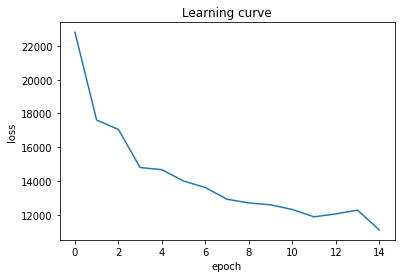

In [7]:
# Hyper-parameters
image_size = 784
h_dim = 400
z_dim = 32
EPOCH = 15
BATCH_SIZE = 128
LR = 0.001
Lambda = 1

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x, _) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = - 0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()

## 1-1. Real samples in dataset

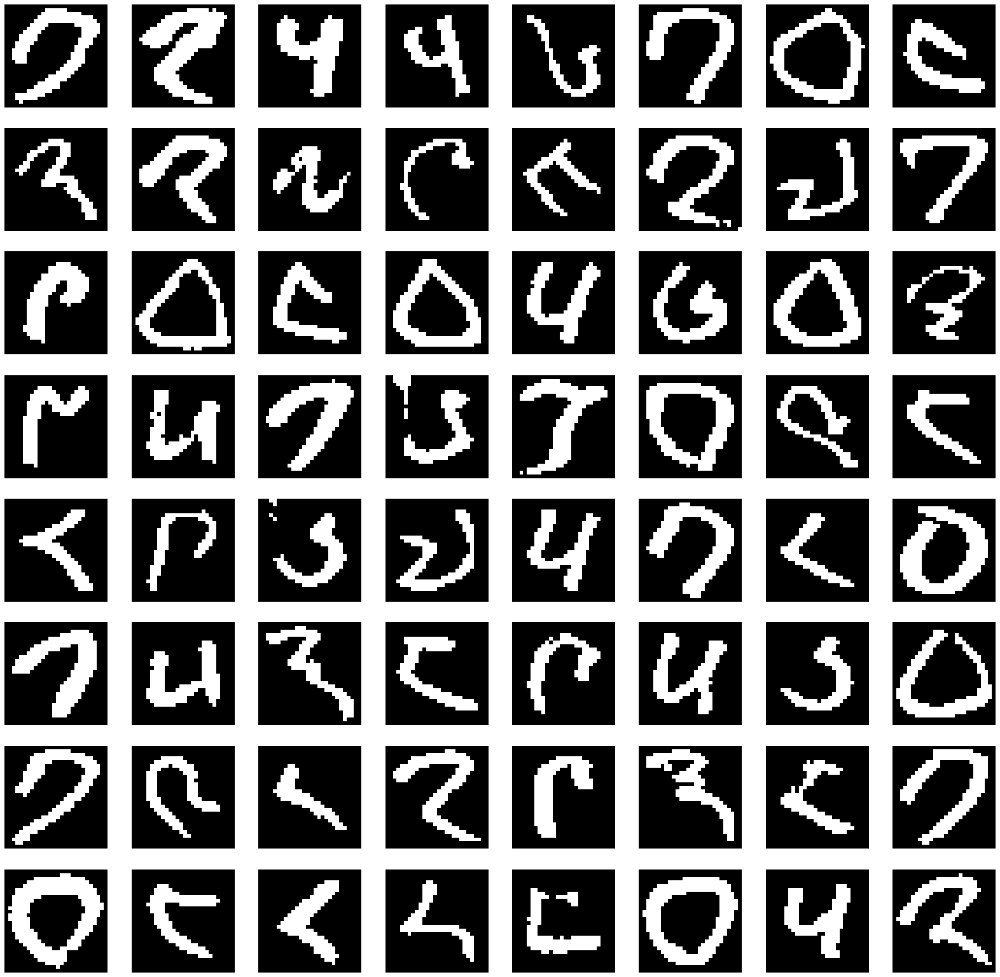

In [8]:
x = torch.tensor(images[:64])
x = x.view(-1,28,28)
x = x.cpu()
fig=plt.figure(figsize=(28,28))
for i in range(64):
    fig.add_subplot(8,8,i+1)
    plt.imshow(x[i],cmap=plt.cm.gray)
    plt.axis('off')
plt.show()

## 1-1. Reconstructed samples using VAE

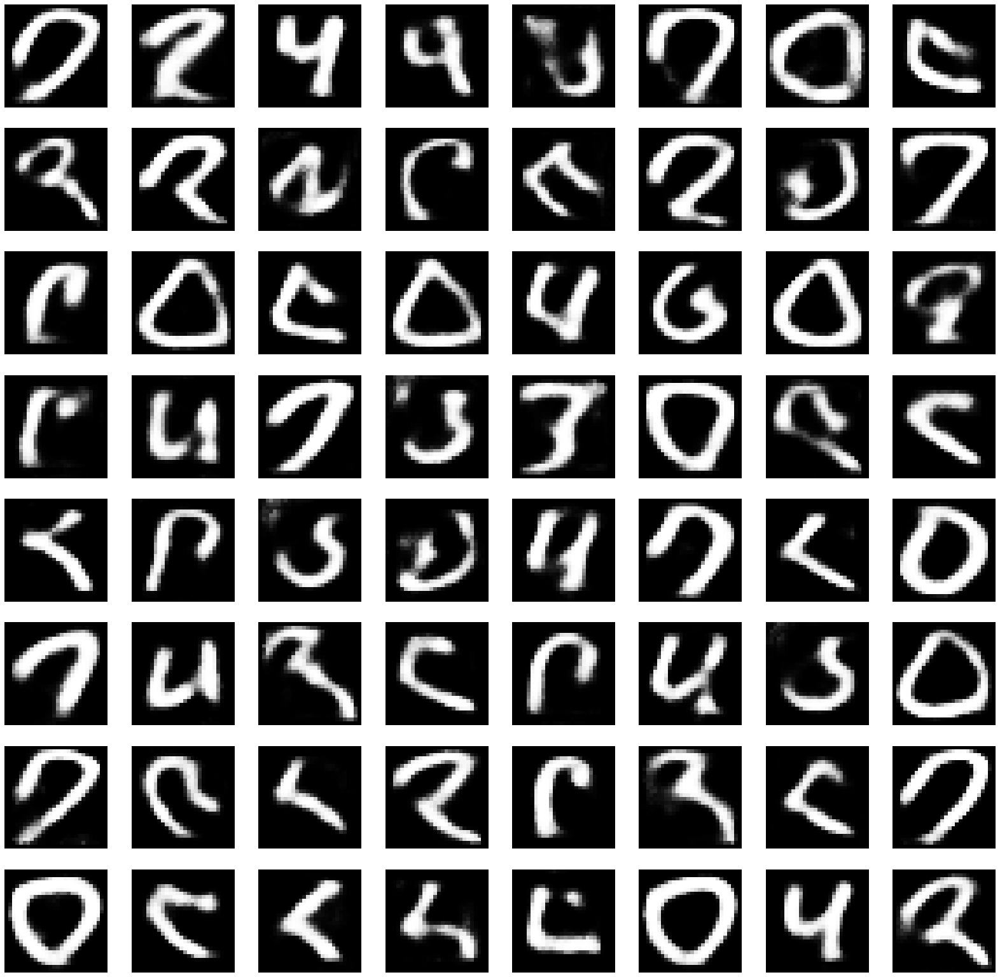

In [6]:
# reconstructed
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(images[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,28,28)
    result = result.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

## 1-2. Synthesized images by sample the prior

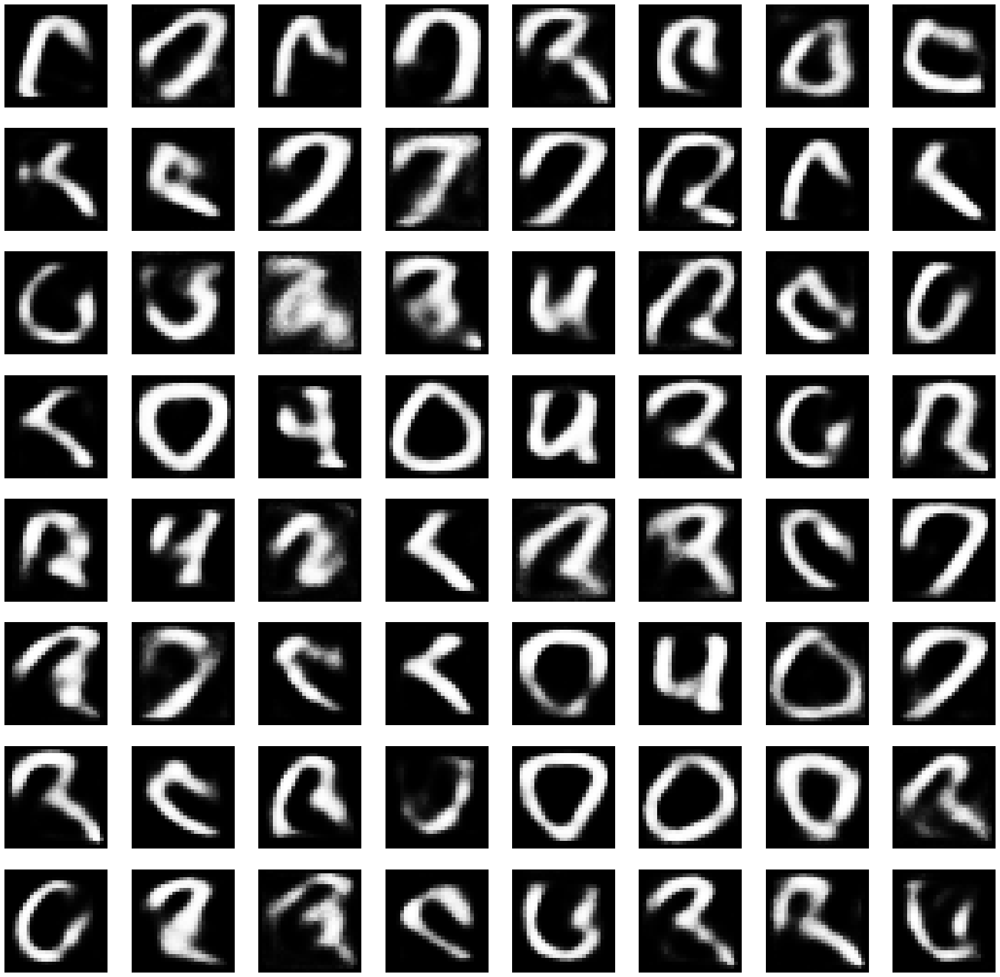

In [15]:
# synthesized
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

## 1-3. Synthesized images based on interpolation

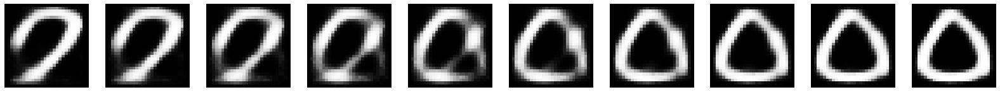

In [10]:
with torch.no_grad():
    inputs = np.append(images[0],images[6000])
    inputs = inputs.reshape(784,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
    #save_image(out, os.path.join('samples', 'synthesize.png'),nrow=10)

## 1.4 Use different $\lambda$ to show step 1,2,3

-----Step 1 with lambda = 0----


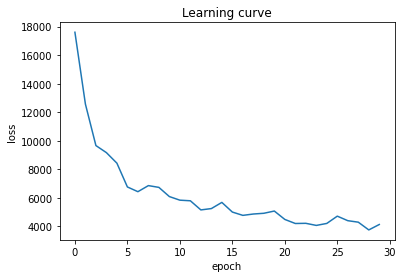

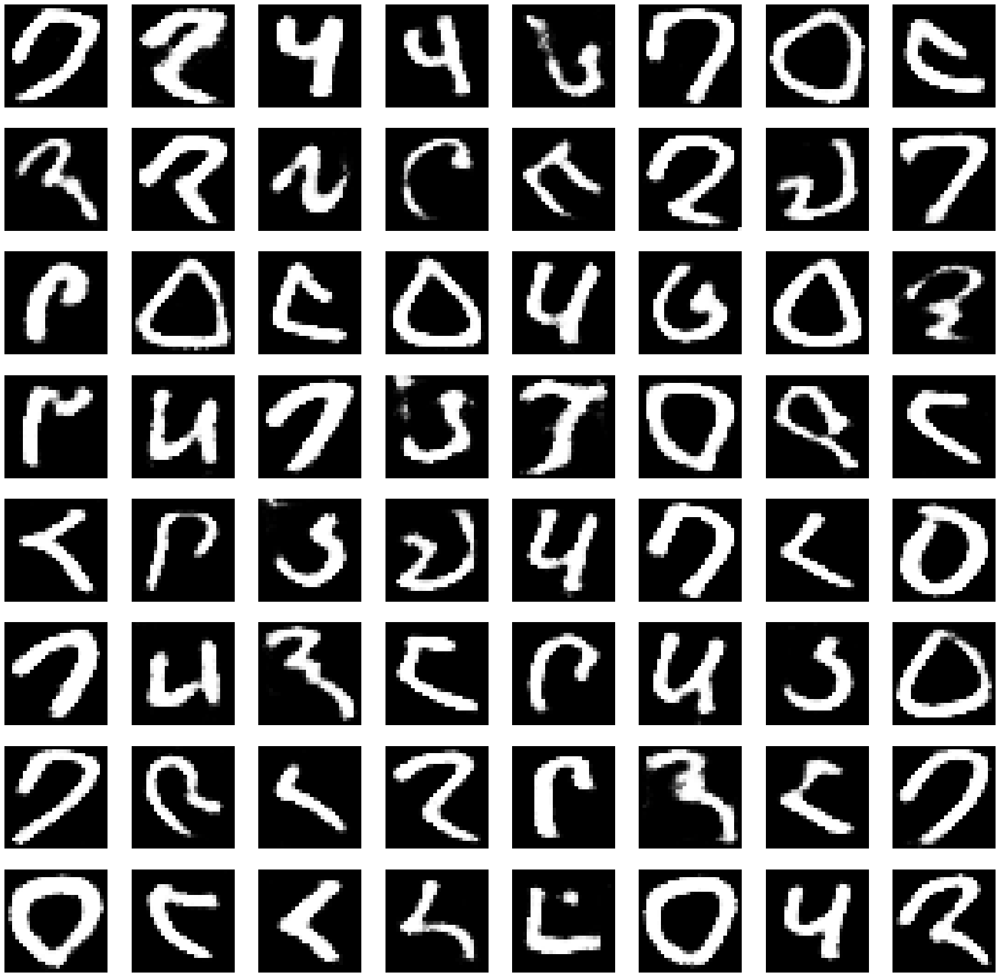




-----Step 2 with lambda = 0----


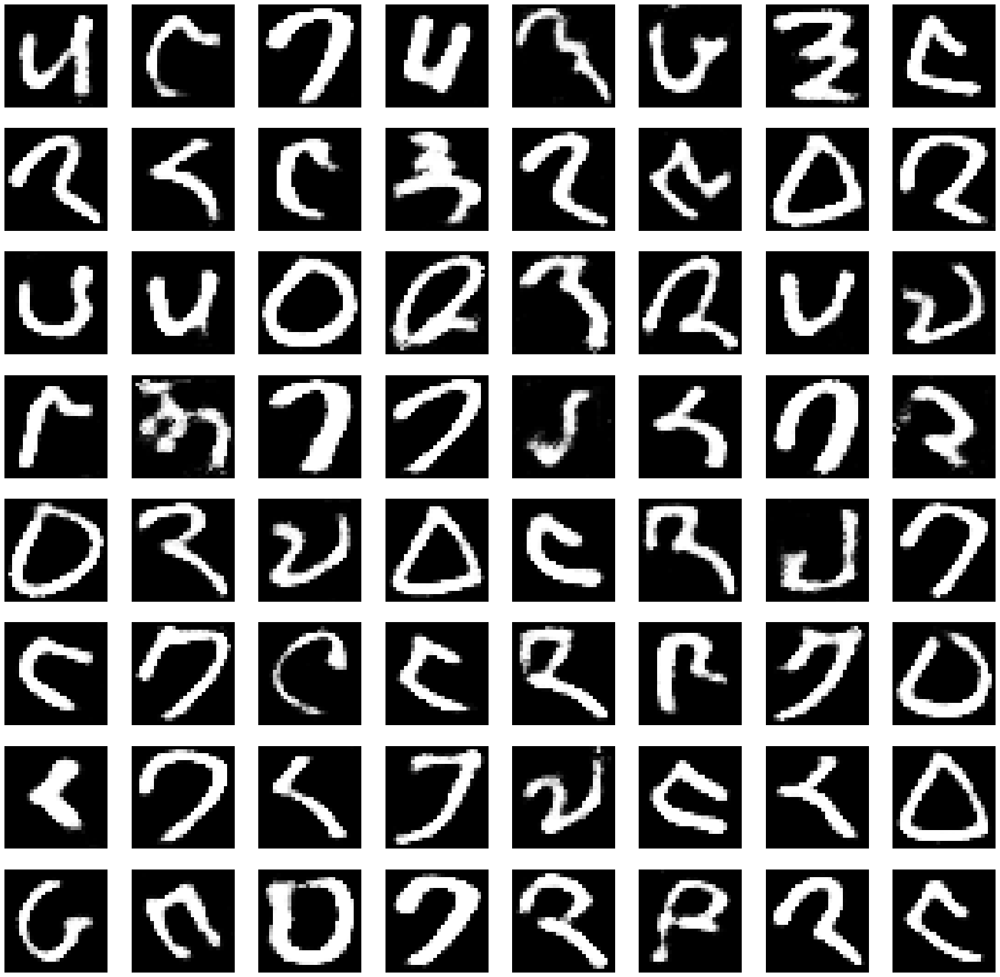




-----Step 3 with lambda = 0----


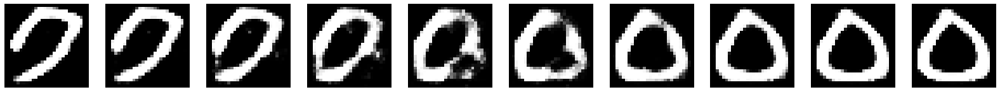

In [6]:
# Hyper-parameters
image_size = 784
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 128
LR = 0.001
Lambda = 0

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x, _) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = - 0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
print("-----Step 1 with lambda = 0----")
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()
#
# reconstructed
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(images[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,28,28)
    result = result.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# synthesize
print("\n\n\n-----Step 2 with lambda = 0----")
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# interpolation
print("\n\n\n-----Step 3 with lambda = 0----")
with torch.no_grad():
    inputs = np.append(images[0],images[6000])
    inputs = inputs.reshape(784,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

-----Step 1 with lambda = 10----


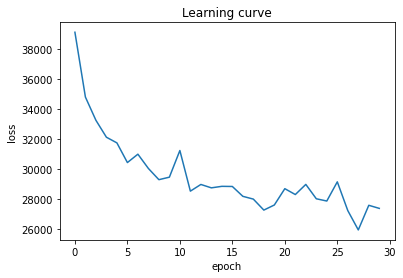

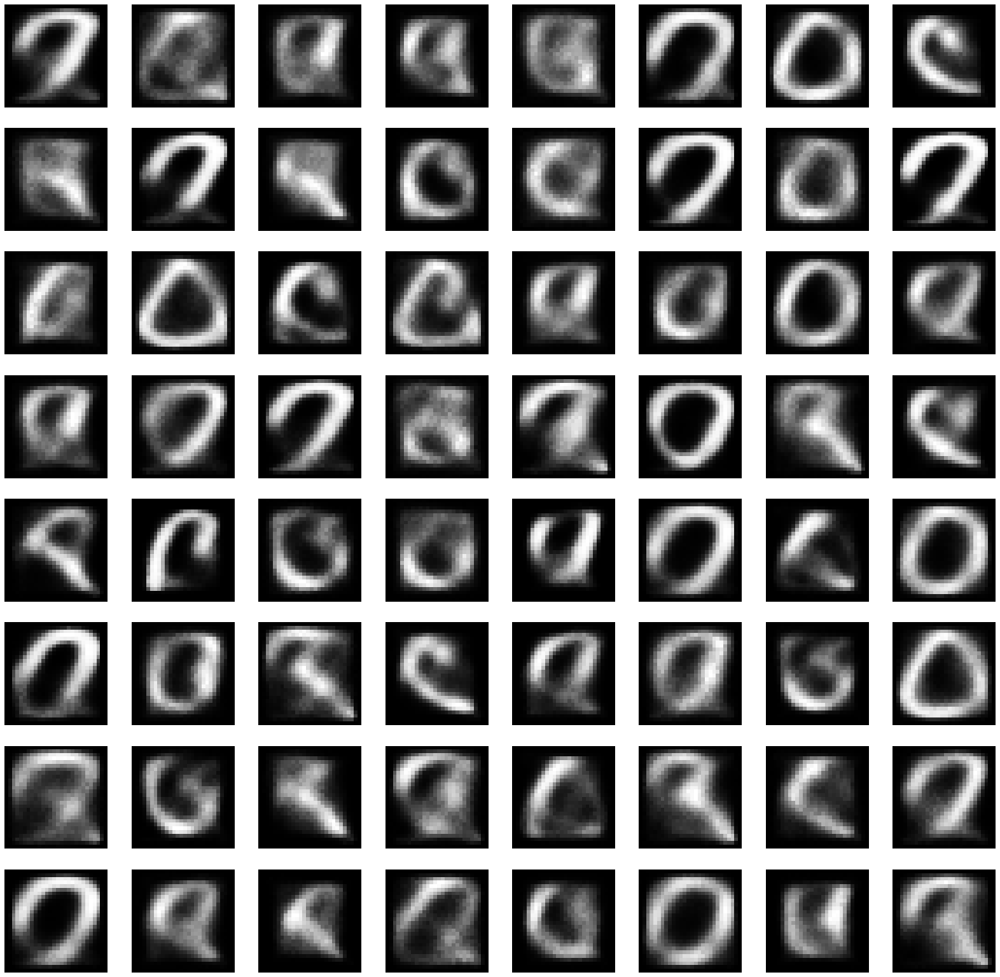




-----Step 2 with lambda = 10----


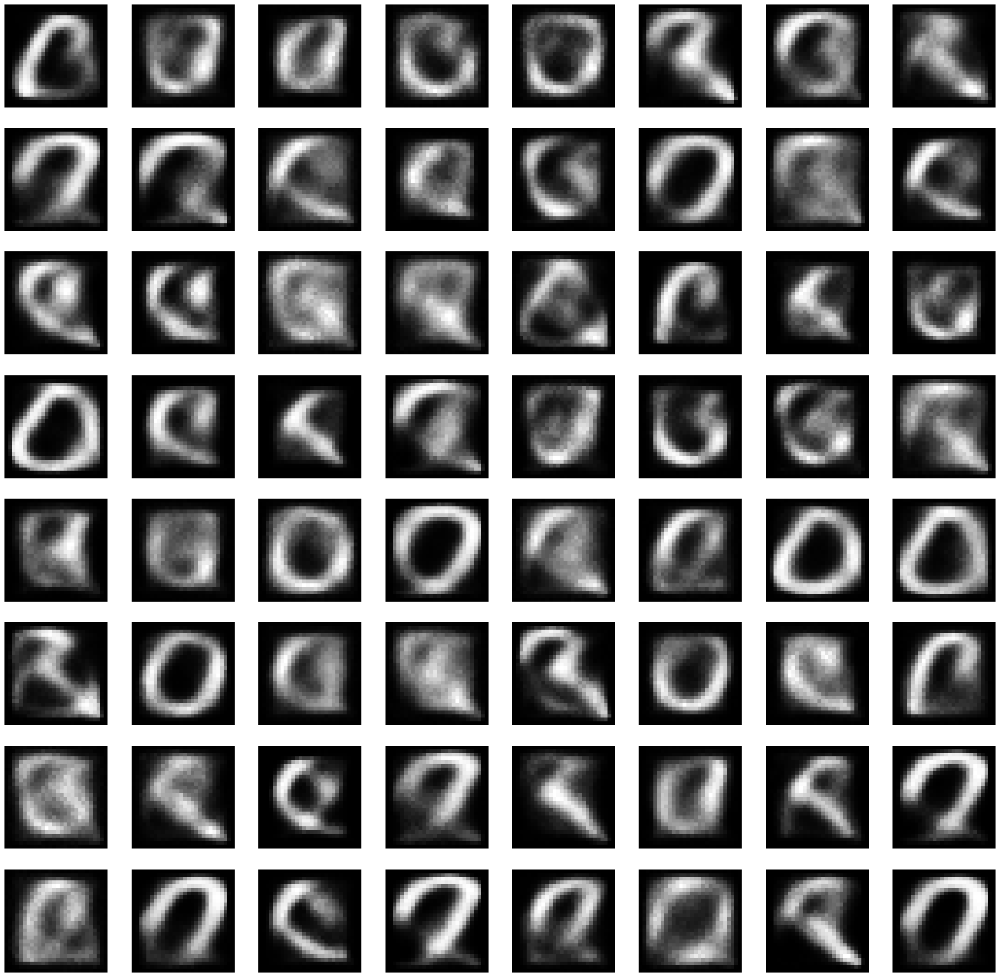




-----Step 3 with lambda = 10----


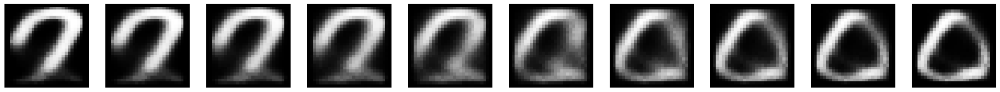

In [7]:
# Hyper-parameters
image_size = 784
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 128
LR = 0.0001
Lambda = 10

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x, _) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = - 0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
print("-----Step 1 with lambda = 10----")
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()
#
# reconstructed
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(images[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,28,28)
    result = result.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# synthesize
print("\n\n\n-----Step 2 with lambda = 10----")
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# interpolation
print("\n\n\n-----Step 3 with lambda = 10----")
with torch.no_grad():
    inputs = np.append(images[0],images[6000])
    inputs = inputs.reshape(784,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

-----Step 1 with lambda = 100----


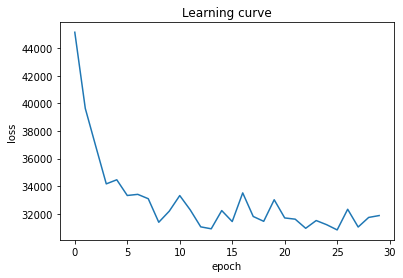

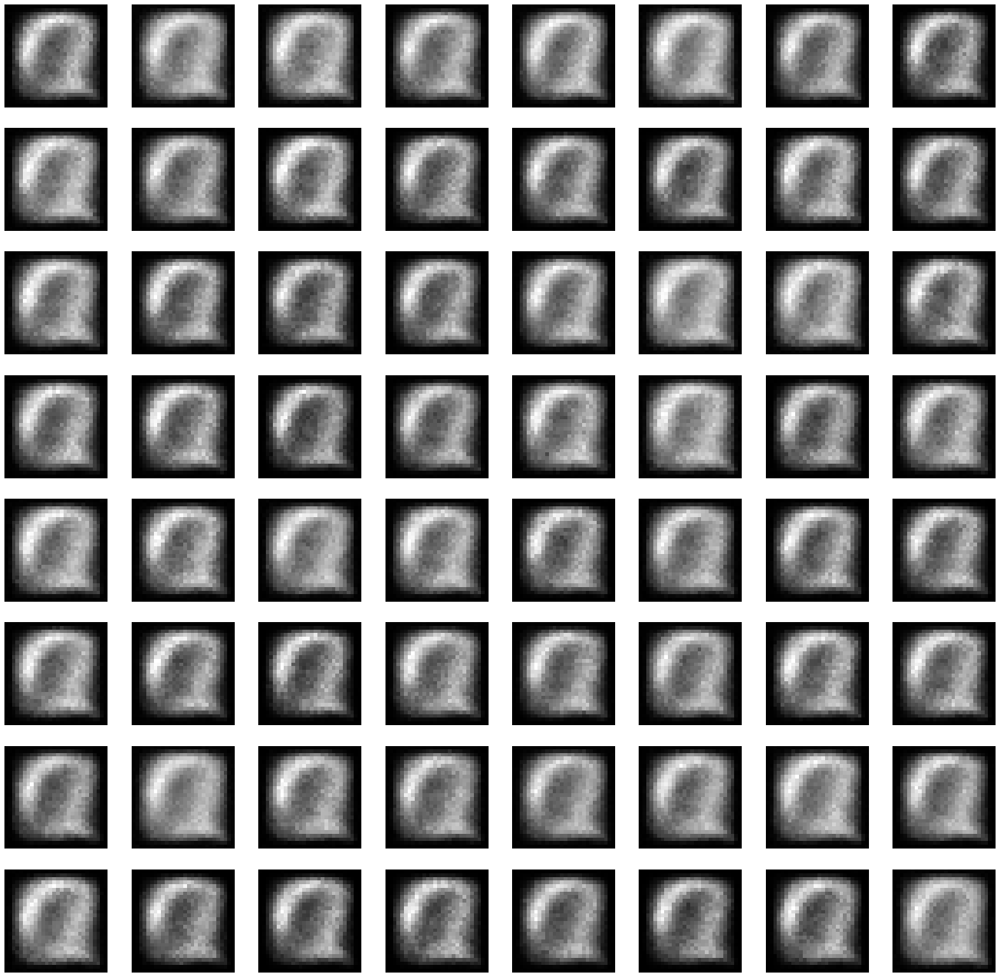




-----Step 2 with lambda = 100----


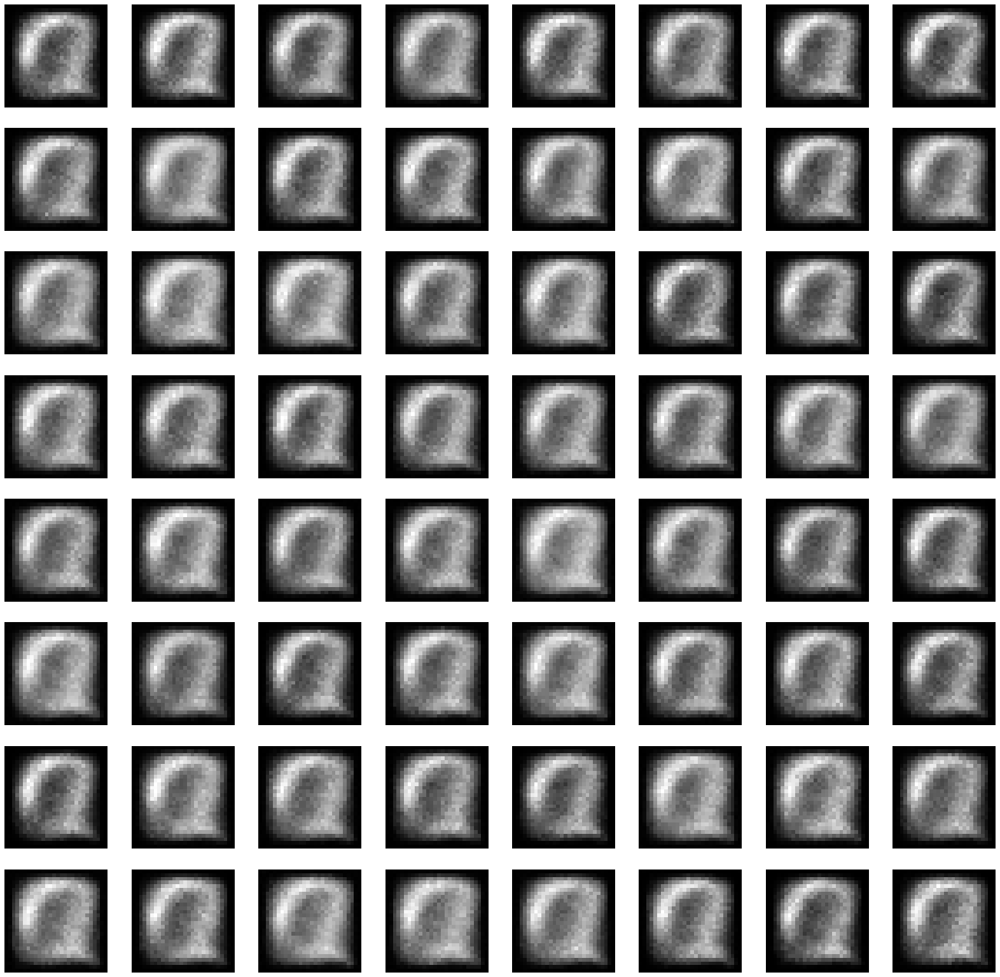




-----Step 3 with lambda = 100----


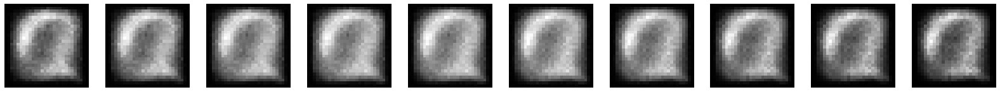

In [8]:
# Hyper-parameters
image_size = 784
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 128
LR = 0.00005
Lambda = 100

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x, _) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = - 0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
print("-----Step 1 with lambda = 100----")
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()
#
# reconstructed
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(images[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,28,28)
    result = result.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# synthesize
print("\n\n\n-----Step 2 with lambda = 100----")
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# interpolation
print("\n\n\n-----Step 3 with lambda = 100----")
with torch.no_grad():
    inputs = np.append(images[0],images[6000])
    inputs = inputs.reshape(784,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,28,28)
    out = out.cpu()
    fig=plt.figure(figsize=(28,28))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

# 2. VAE with anime faces

In [2]:
import matplotlib.image as mpimg
# read file
imgs = []
for i in range(21551):
    img = mpimg.imread('VAE_dataset\\data\\'+str(i+1)+'.png')
    torch.tensor(img)
    imgs.append(img)

In [3]:
# VAE model
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(image_size, h_dim) # encoder
        self.fc2 = nn.Linear(h_dim, z_dim) # mean vector
        self.fc3 = nn.Linear(h_dim, z_dim) # std vector
        self.fc4 = nn.Linear(z_dim, h_dim) # decoder
        self.fc5 = nn.Linear(h_dim, image_size) # decoder
        
    def encode(self, x):
        h = F.relu(self.fc1(x))
        return self.fc2(h), self.fc3(h)
    
    def reparameter(self, mean, log_var):
        std = torch.exp(log_var)**0.5
        eps = torch.randn_like(std)
        return mean + eps * std
    
    def decode(self, z):
        h = torch.relu(self.fc4(z))
        return torch.sigmoid(self.fc5(h))
    
    def forward(self, x):
        mean, log_var = self.encode(x)
        z = self.reparameter(mean, log_var)
        out = self.decode(z)
        return out,mean,log_var

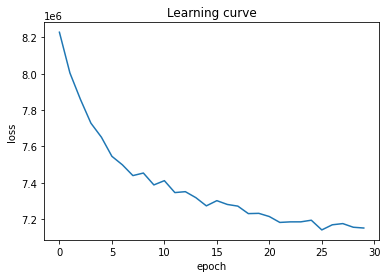

In [13]:
# Hyper-parameters
image_size = 64*64*3
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 2048
LR = 0.001
Lambda = 1

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataset = imgs
random.shuffle(dataset)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = 0.5*torch.sum(torch.exp(log_var)-(1 + log_var)+mean.pow(2))
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()

## 2-1. Real samples in dataset

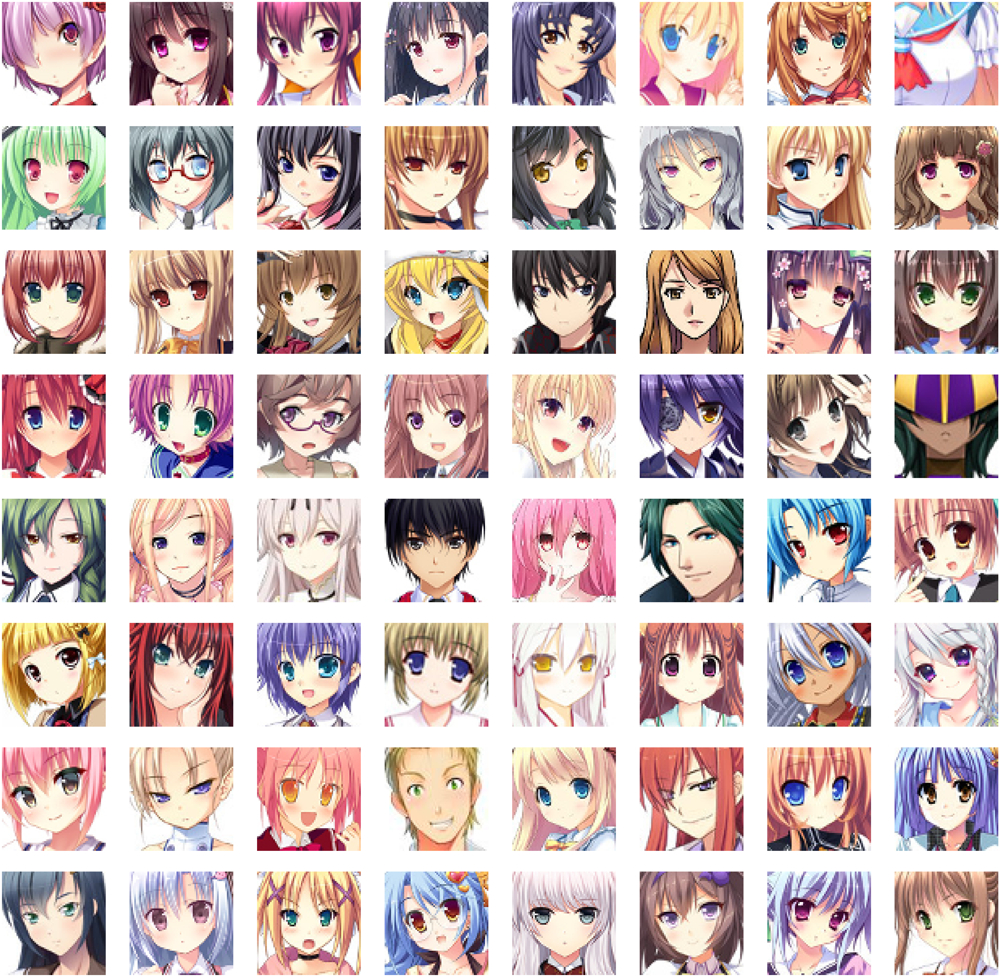

In [32]:
x = torch.tensor(dataset[:64])
x = x.view(-1,64,64,3)
x = x.cpu()
fig=plt.figure(figsize=(64,64))
for i in range(64):
    fig.add_subplot(8,8,i+1)
    plt.imshow(x[i],cmap=plt.cm.gray)
    plt.axis('off')
plt.show()

## 2-1. Reconstructed samples using VAE

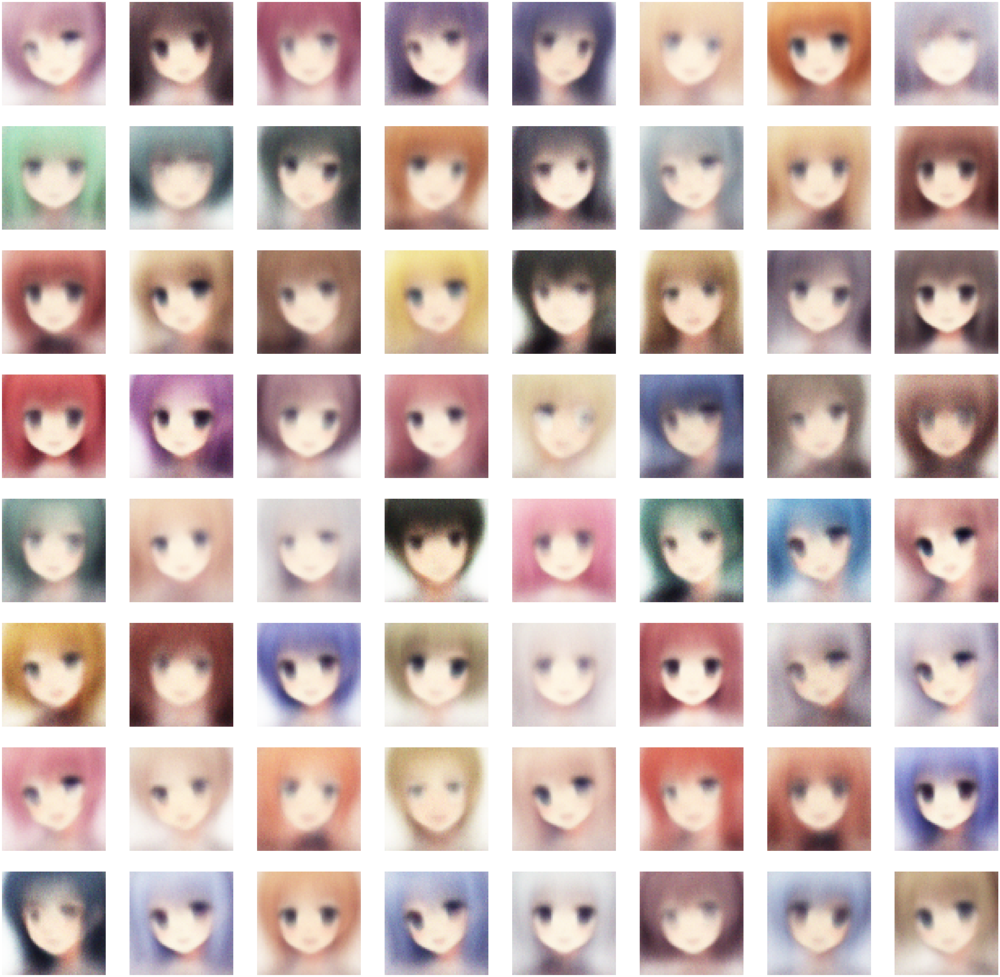

In [31]:
# reconstructed
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(dataset[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,64,64,3)
    result = result.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

## 2-2 Synthesized images by sample the prior

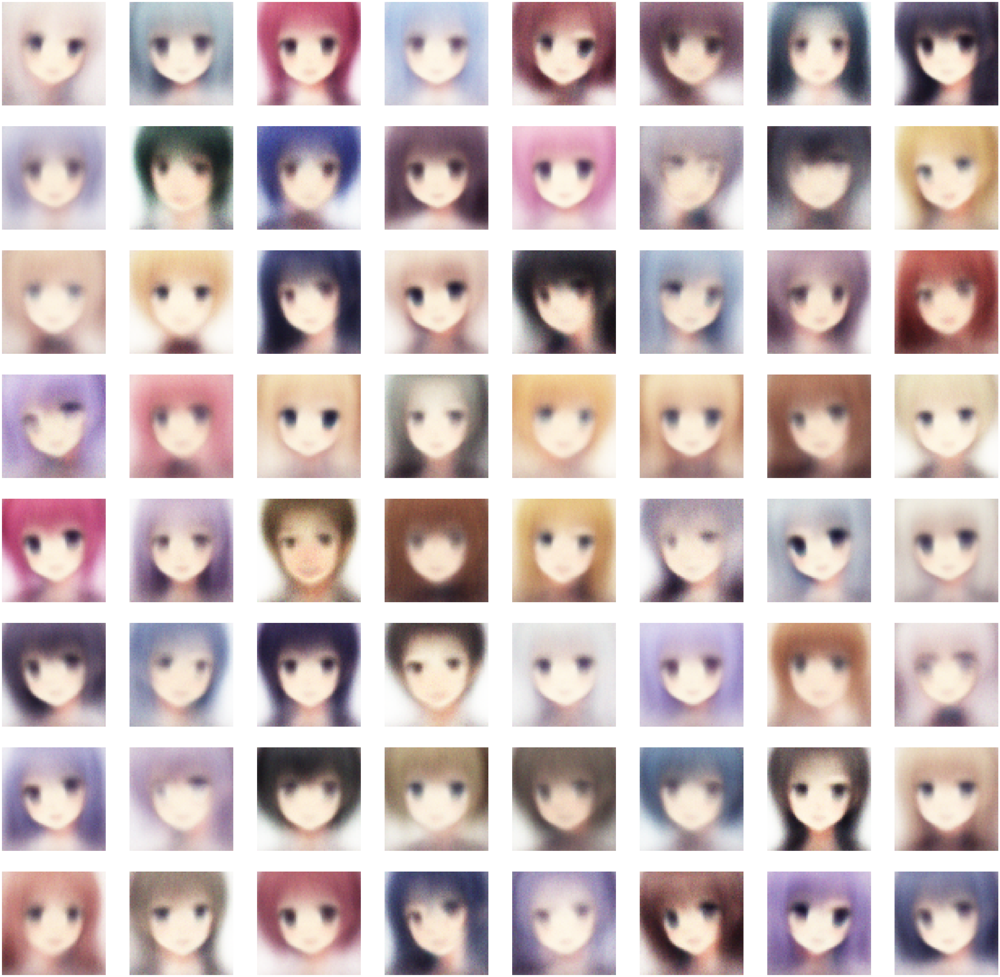

In [25]:
# synthesized
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

## 2-3. Synthesized images based on interpolation

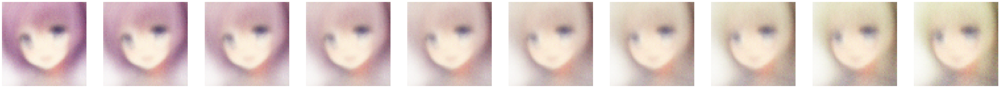

In [15]:
with torch.no_grad():
    inputs = np.append(imgs[0],imgs[10000])
    inputs = inputs.reshape(64*64*3,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

## 2.4 Use different $\lambda$ to show step 1,2,3

-----Step 1 with lambda = 0----


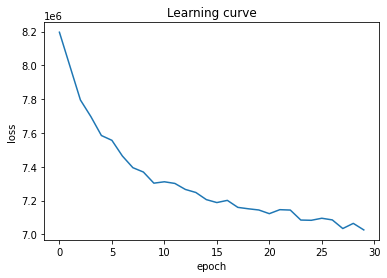

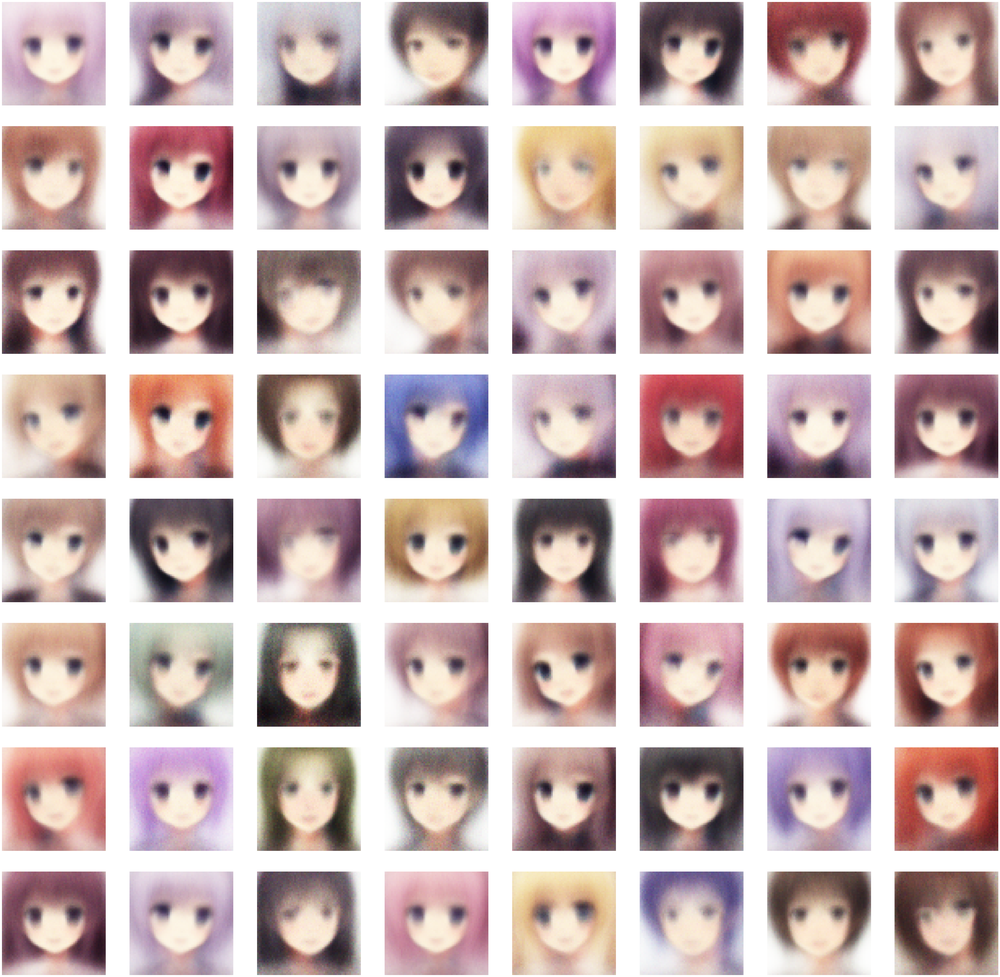




-----Step 2 with lambda = 0----


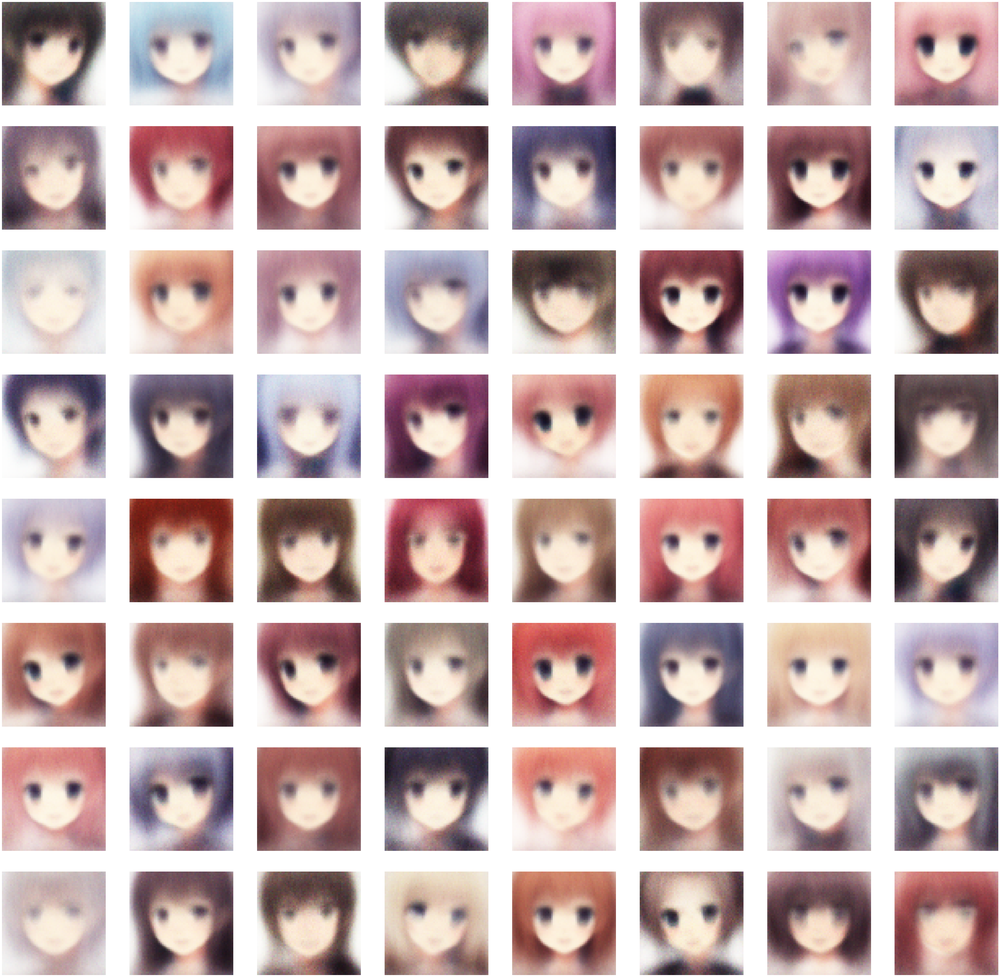




-----Step 3 with lambda = 0----


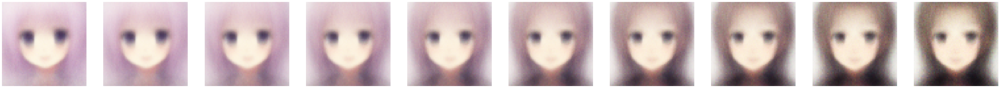

In [5]:
# Hyper-parameters
image_size = 64*64*3
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 2048
LR = 0.001
Lambda = 0
# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataset = imgs
random.shuffle(dataset)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = 0.5*torch.sum(torch.exp(log_var)-(1 + log_var)+mean.pow(2))
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
print("-----Step 1 with lambda = 0----")
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()
#
# reconstruct
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(dataset[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,64,64,3)
    result = result.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# synthesized
print("\n\n\n-----Step 2 with lambda = 0----")
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# interpolation
print("\n\n\n-----Step 3 with lambda = 0----")
with torch.no_grad():
    inputs = np.append(imgs[0],imgs[10000])
    inputs = inputs.reshape(64*64*3,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

-----Step 1 with lambda = 10----


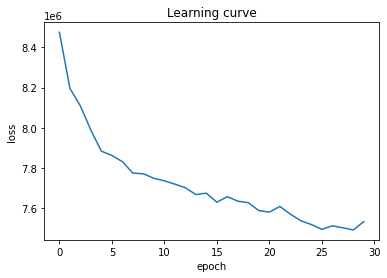

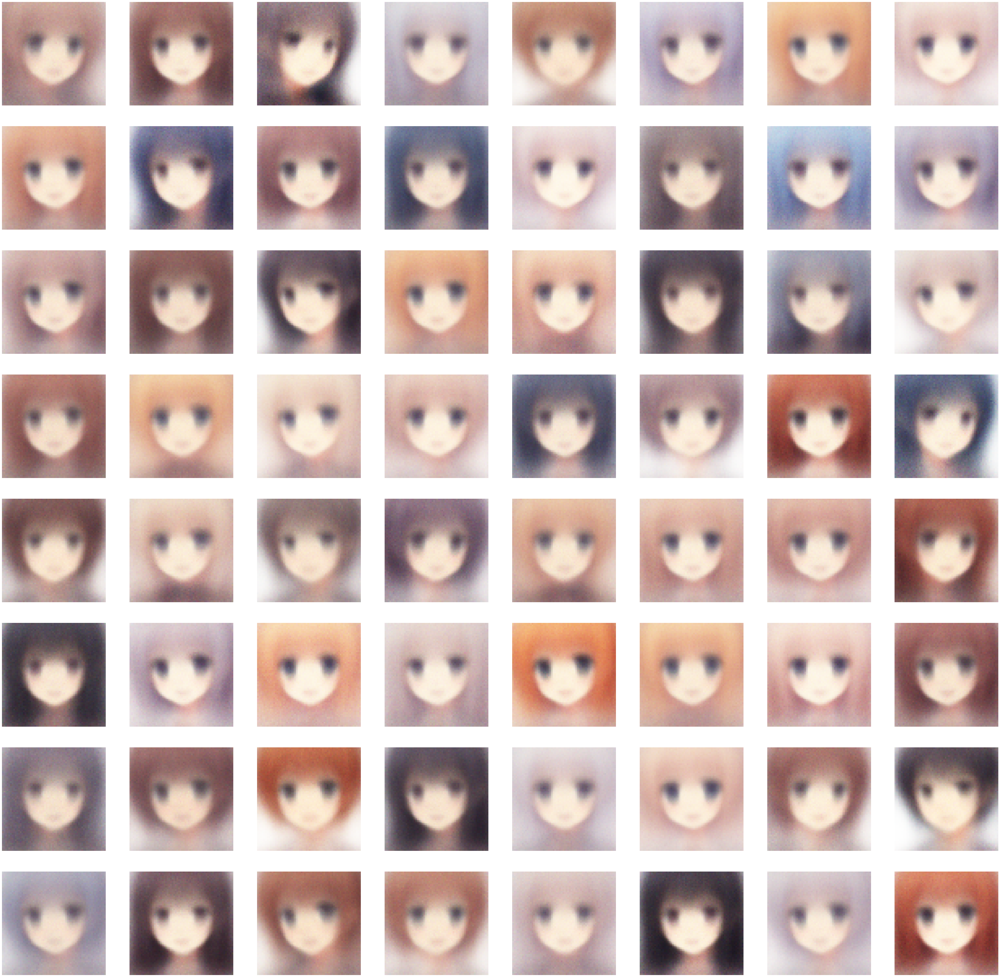




-----Step 2 with lambda = 10----


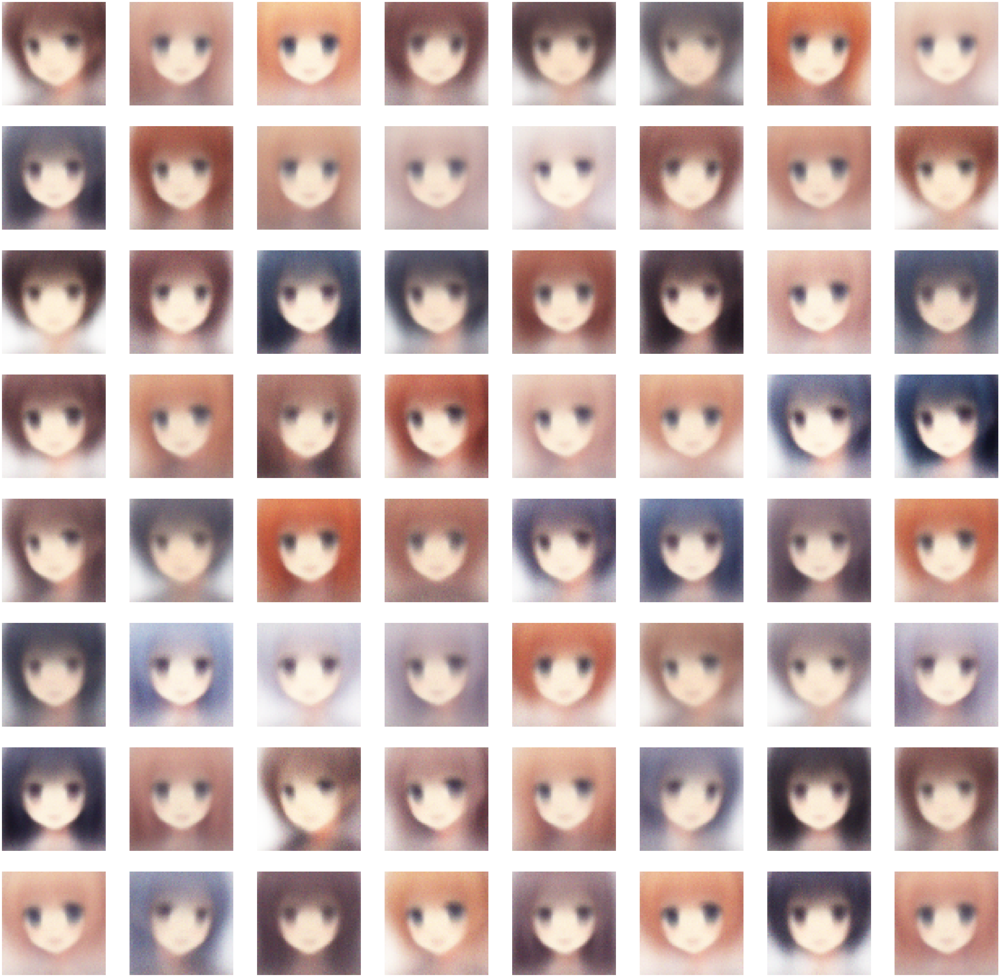




-----Step 3 with lambda = 10----


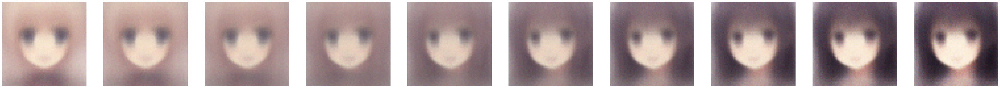

In [44]:
# Hyper-parameters
image_size = 64*64*3
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 2048
LR = 0.001
Lambda = 10

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataset = imgs
random.shuffle(dataset)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = 0.5*torch.sum(torch.exp(log_var)-(1 + log_var)+mean.pow(2))
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
print("-----Step 1 with lambda = 10----")
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()
#
# reconstructe
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(dataset[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,64,64,3)
    result = result.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# synthesized
print("\n\n\n-----Step 2 with lambda = 10----")
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# interpolation
print("\n\n\n-----Step 3 with lambda = 10----")
with torch.no_grad():
    inputs = np.append(imgs[0],imgs[10000])
    inputs = inputs.reshape(64*64*3,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()

-----Step 1 with lambda = 100----


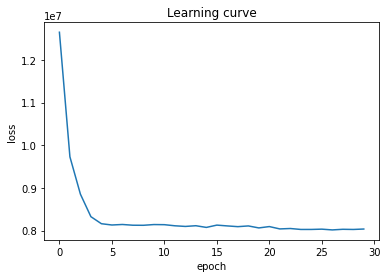

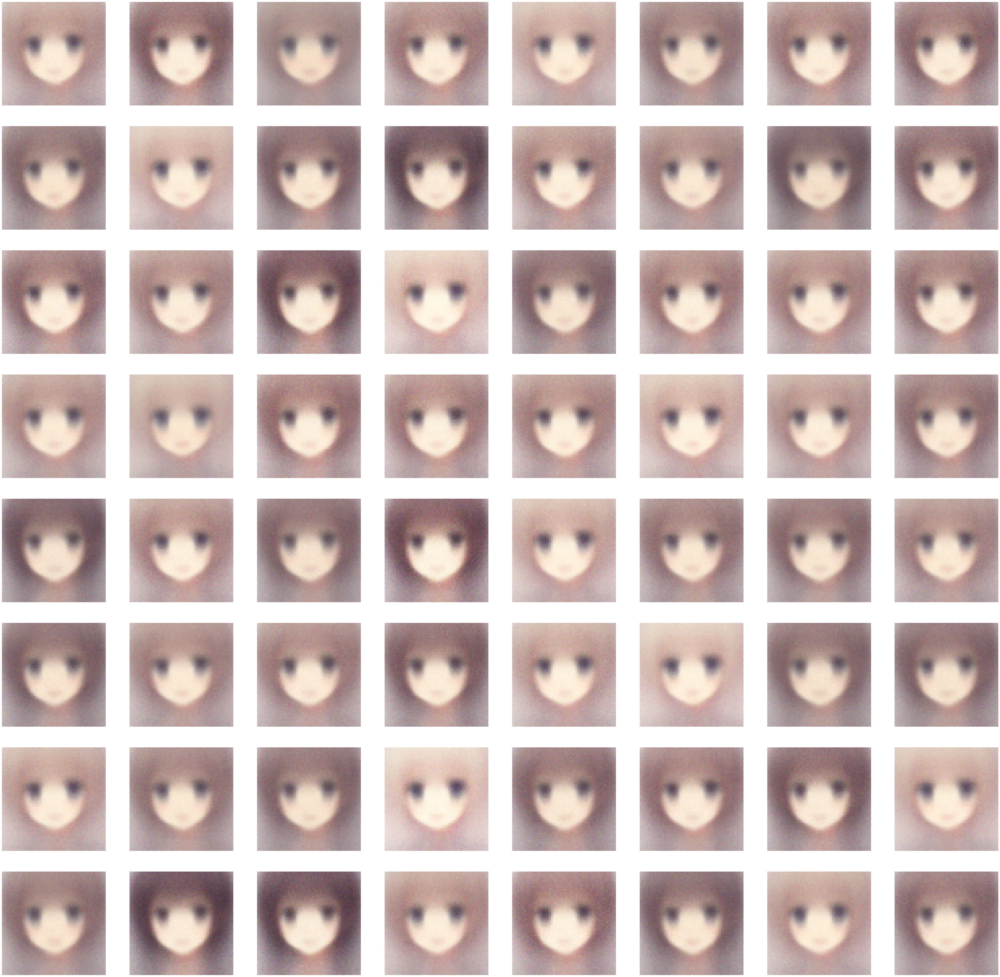




-----Step 2 with lambda = 100----


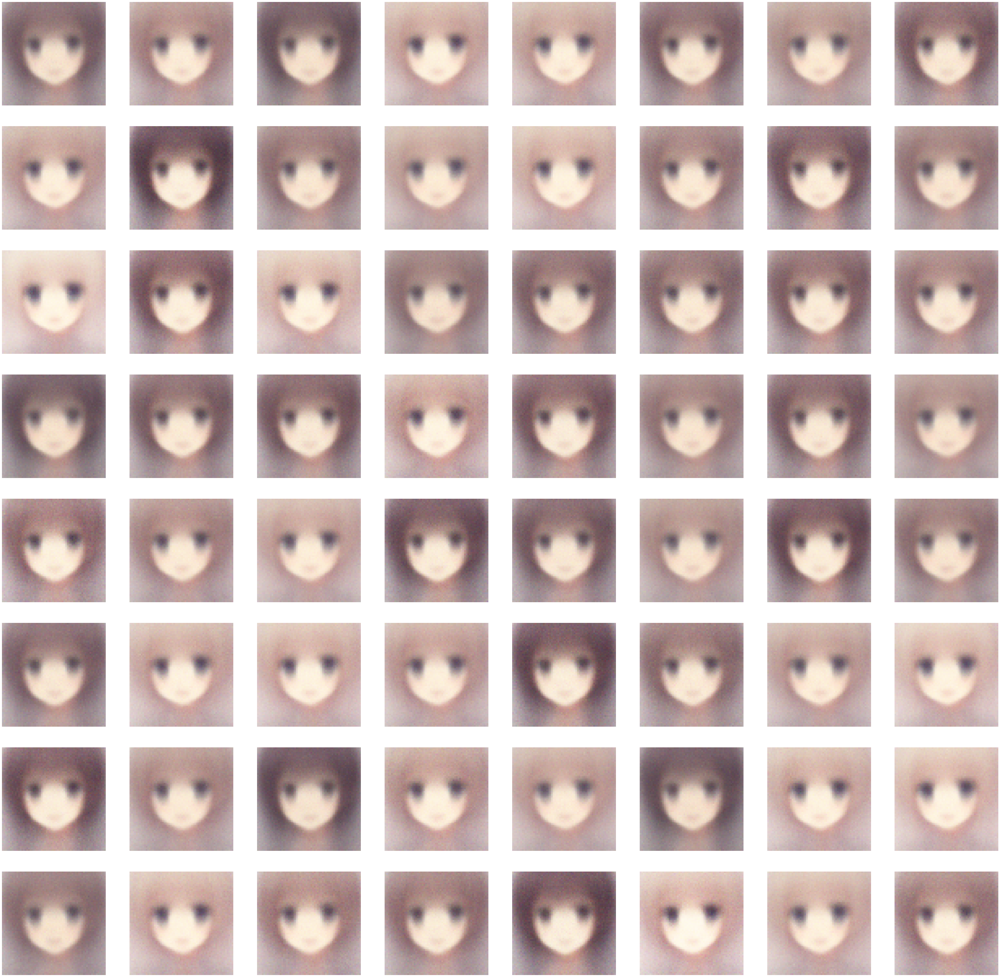




-----Step 3 with lambda = 100----


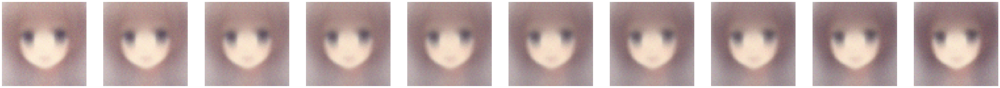

In [45]:
# Hyper-parameters
image_size = 64*64*3
h_dim = 400
z_dim = 32
EPOCH = 30
BATCH_SIZE = 2048
LR = 0.001
Lambda = 100

# setting model
model = VAE().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
dataset = imgs
random.shuffle(dataset)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE,shuffle=True)
# training
loss_list = []
mean,log_var = 0,0
for epoch in range(EPOCH):
    loss = 0
    for i, (x) in enumerate(dataloader):
        # feed forward
        x = x.float()
        x = x.view(-1, image_size)
        x = x.to(device)
        result,mean,log_var = model(x)
        # get KL divergence
        reconst_loss = F.binary_cross_entropy(result, x,reduction='sum')
        kl_div = 0.5*torch.sum(torch.exp(log_var)-(1 + log_var)+mean.pow(2))
        
        # backpropagation
        loss = reconst_loss+kl_div*Lambda
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    loss_list.append(loss)
    #print ("Epoch:",epoch+1,", Loss:", loss.item())
# plot graph
print("-----Step 1 with lambda = 100----")
plt.plot(loss_list)
plt.title("Learning curve")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.show()
#
# reconstructe
with torch.no_grad():
    # sim graph with prior
    x = torch.tensor(dataset[:64])
    x = x.to(device)
    x = x.view(-1, image_size)
    x = x.float()
    result,_,_ = model(x)
    result = result.view(-1,64,64,3)
    result = result.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(result[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# synthesized
print("\n\n\n-----Step 2 with lambda = 100----")
with torch.no_grad():
    # sim graph with prior
    std = torch.exp(log_var)**0.5
    eps = torch.randn_like(std)
    n = Normal(mean,std)
    z = n.sample()
    out = model.decode(z).view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(64):
        fig.add_subplot(8,8,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()
#
# interpolation
print("\n\n\n-----Step 3 with lambda = 100----")
with torch.no_grad():
    inputs = np.append(imgs[0],imgs[10000])
    inputs = inputs.reshape(64*64*3,2)
    inputs = torch.from_numpy(inputs).to(device)
    inputs = inputs.view(-1,image_size)
    inputs = inputs.float()
    mean_, log_var_ = model.encode(inputs)
    z = model.reparameter(mean_,log_var_)
    z = z.T
    z = z.view(1,z_dim,2)
    z = F.interpolate(z, scale_factor=5, mode='linear', align_corners=True)
    z = z.T
    z = z.view(-1,z_dim)
    out = model.decode(z)
    out = out.view(-1,64,64,3)
    out = out.cpu()
    fig=plt.figure(figsize=(64,64))
    for i in range(len(out)):
        fig.add_subplot(1,10,i+1)
        plt.imshow(out[i],cmap=plt.cm.gray)
        plt.axis('off')
    plt.show()